In [2]:
import pandas as pd
%matplotlib inline

In [ ]:
mylist = []
for chunk in  pd.read_csv('anaphora.csv', sep=',', chunksize=2000, encoding='cp1251'):#, nrows=7000):
    mylist.append(chunk)

anaphora = pd.concat(mylist, axis= 0)
del mylist

In [ ]:
#anaphora = pd.read_csv('anaphora.csv', sep=',', nrows=7000)
anaphora

In [ ]:
def floatise(series):
    print(series)
    if series != '[[]]':
        return [float(x.strip()) for x in series.replace('[[','').replace(']]', '').split(',')]
    else:
        return []

vec_cols =  ['t_vec-3', 't_vec-5', 't_vec+3', 't_vec+5', 'discourse',
             "cand_vec", 'c_vec-3', 'c_vec-5', 'c_vec+3', 'c_vec+5',
             'dif_vec-3', 'dif_vec-5', 'dif_vec+3', 'dif_vec+5',
             'dif_cand_disc']
anaph = anaphora.loc[:7000,]
for vec in vec_cols:
    anaph[vec] = anaph[vec].apply(floatise)
#anaphora['c_vec+3'].apply(floatise)
#an = anaphora.loc[1, 'c_vec+3'].replace('[[','').replace(']]', '').split(',')
#ls = []
#for a in an:
#    ls.append(float(a.strip()))
#print(ls)

[[0.005529418587684631, -0.0004933830350637436, -0.007498469203710556, 0.007638526614755392, 0.048705555498600006, -0.07017023861408234, 0.01683225855231285, -0.02933075651526451, -0.06710826605558395, -0.12508049607276917, -0.049066778272390366, 0.009653542190790176, -0.009394751861691475, -0.021792862564325333, 0.10974082350730896, 0.06467152386903763, 0.042755622416734695, -0.04101381450891495, -0.012282546609640121, 0.06577833741903305, 0.023918936029076576, 0.013727841898798943, 0.0014706850051879883, 0.11128679662942886, 0.018291134387254715, -0.012017740868031979, -0.0017332230927422643, 0.056763872504234314, -0.0345846563577652, 0.03327912837266922, 0.031032875180244446, -0.0006475672125816345, 0.03161301463842392, -0.03703559562563896, 0.047605063766241074, 0.018623139709234238, 0.00028722919523715973, 0.00691471341997385, -0.03640314191579819, 0.02011735923588276, -0.004037052392959595, -0.09002667665481567, -0.02824820578098297, 0.03565532714128494, 0.01571788638830185, 0.01

C:\Users\Ksenia\Anaconda3\lib\site-packages\ipykernel\__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [6]:
anaphora = anaphora.drop('Unnamed: 0', axis=1)

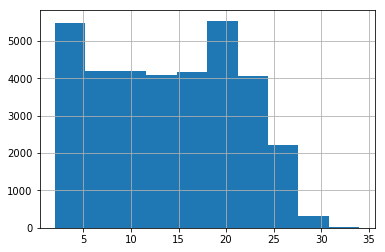

In [7]:
anaphora['dist'].hist()

In [8]:
len(anaphora)

34272

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [10]:
anaphora.columns

Index(['answ', 'c_count', 'c_gend', 'c_pow', 'c_vec+3', 'c_vec+5', 'c_vec-3',
       'c_vec-5', 'cand_vec', 'dif_cand_disc', 'dif_vec+3', 'dif_vec+5',
       'dif_vec-3', 'dif_vec-5', 'discourse', 'dist', 't_count', 't_gend',
       't_vec+3', 't_vec+5', 't_vec-3', 't_vec-5', 'target'],
      dtype='object')

In [41]:
train_cols = ['t_vec-3', 't_vec-5', 't_vec+3', 't_vec+5', 'discourse',
                         "cand_vec", 'c_vec-3', 'c_vec-5', 'c_vec+3', 'c_vec+5',
                         'dif_vec-3', 'dif_vec-5', 'dif_vec+3', 'dif_vec+5',
                         'dif_cand_disc', 'answ']

#anaph['answ'] = anaphora['answ']
print(anaph.head())
train = anaphora.loc[:5000, train_cols]
test = anaphora.loc[5001:6000, train_cols]

[0.005529418587684631, -0.0004933830350637436, -0.007498469203710556, 0.007638526614755392, 0.048705555498600006, -0.07017023861408234, 0.01683225855231285, -0.02933075651526451, -0.06710826605558395, -0.12508049607276917, -0.049066778272390366, 0.009653542190790176, -0.009394751861691475, -0.021792862564325333, 0.10974082350730896, 0.06467152386903763, 0.042755622416734695, -0.04101381450891495, -0.012282546609640121, 0.06577833741903305, 0.023918936029076576, 0.013727841898798943, 0.0014706850051879883, 0.11128679662942886, 0.018291134387254715, -0.012017740868031979, -0.0017332230927422643, 0.056763872504234314, -0.0345846563577652, 0.03327912837266922, 0.031032875180244446, -0.0006475672125816345, 0.03161301463842392, -0.03703559562563896, 0.047605063766241074, 0.018623139709234238, 0.00028722919523715973, 0.00691471341997385, -0.03640314191579819, 0.02011735923588276, -0.004037052392959595, -0.09002667665481567, -0.02824820578098297, 0.03565532714128494, 0.01571788638830185, 0.018

AttributeError: 'list' object has no attribute 'replace'

In [15]:
model_vec = RandomForestClassifier()
model_vec.fit(train[train.columns.difference(['answ'])], train['answ'])
print(classification_report(test['answ'], model_vec.predict(test[test.columns.difference(['answ'])])))

ValueError: could not convert string to float: '[[-0.01304573006927967, 0.051607705652713776, 0.052188072353601456, 0.002404076512902975, -0.012101921252906322, 0.06848089396953583, -0.004799501039087772, 0.02123260498046875, 0.029678713530302048, -0.06285572797060013, -0.038478054106235504, 0.022412698715925217, -0.010005917400121689, 0.058224067091941833, -0.030385697260499, 0.06357206404209137, 0.040494270622730255, 0.04875936359167099, 0.07582717388868332, 0.03649488836526871, 0.021294673904776573, 0.05455508455634117, 0.02581937611103058, 0.01628604158759117, -0.03662707656621933, -0.012103438377380371, 0.024484623223543167, -0.04937063530087471, -0.09660081565380096, 0.07538996636867523, -0.04051119089126587, -0.040388911962509155, -0.021425969898700714, 0.06544508039951324, -0.03259286284446716, -0.011602222919464111, -0.0022429227828979492, 0.022622842341661453, -0.08243995159864426, 0.022693568840622902, -0.026415351778268814, -0.0051114242523908615, 0.009491478092968464, 0.023254849016666412, -0.03188026323914528, 0.007397408597171307, -0.044230397790670395, -0.03615836054086685, 0.08056925982236862, -0.016262251883745193, -0.0424589142203331, -0.024322861805558205, -0.04270946979522705, 0.04372899606823921, -0.05164579302072525, 0.004248736426234245, -0.018007829785346985, -0.04192309454083443, 0.01460963487625122, -0.01394078228622675, -0.07021847367286682, -0.14520376920700073, 0.002458467846736312, -0.030094115063548088, 0.014852860011160374, -0.009523259475827217, -0.024682149291038513, -0.020790165290236473, -0.012657612562179565, 0.15686289966106415, -0.0035527432337403297, 0.036863744258880615, 0.05572642758488655, 0.03259008377790451, -0.06459686160087585, 0.05926315486431122, 0.022024132311344147, 0.018536560237407684, 0.07157057523727417, -0.0636456161737442, 0.0008666655048727989, -0.011002897284924984, -0.06421898305416107, 0.03390942141413689, 0.03758424520492554, -0.013199688866734505, -0.023252932354807854, 0.07142946124076843, 0.04745689779520035, -0.010117901489138603, -0.0625469982624054, 0.04819251596927643, 0.020456477999687195, -0.004508106037974358, 0.022746924310922623, -0.02467462234199047, 0.030534805729985237, 0.07820625603199005, 0.06894272565841675, 0.03424125537276268, -0.016964605078101158, 0.05152123048901558, -0.0035769292153418064, -0.09074857831001282, -0.1109088584780693, -0.002475576475262642, -0.024070437997579575, 0.044537242501974106, 0.07824796438217163, 0.019417231902480125, 0.027577564120292664, 0.024763653054833412, 0.0001596640795469284, 0.05744180828332901, 0.0017955778166651726, 0.07320509105920792, 0.03158596158027649, -0.01855468936264515, 0.015568223781883717, 0.0032890494912862778, 0.02339884452521801, -0.04183269664645195, 0.030074916779994965, -0.06136462092399597, -0.05422769486904144, -0.04844285175204277, -0.02659268118441105, 0.011963905766606331, -0.04283779114484787, -0.021211661398410797, 0.039947133511304855, -0.01990865170955658, -0.03175850212574005, -0.08447249978780746, -0.01354270987212658, -0.02520385943353176, 0.031527481973171234, -0.015474125742912292, 0.017312418669462204, -0.020404644310474396, -0.0074077993631362915, -0.0014019832015037537, -0.045130811631679535, 0.013866990804672241, 0.04920465499162674, 0.06132086366415024, -0.034807030111551285, -0.074287049472332, -0.011833179742097855, -0.04849901795387268, -0.020186681300401688, -0.005599852651357651, 0.0273564625531435, 0.006102952174842358, 0.019122442230582237, -0.00047375308349728584, -0.013065521605312824, -0.02221570909023285, -0.03848296031355858, 0.12900835275650024, -0.0029254136607050896, 0.017694436013698578, 0.0036074556410312653, -0.00037120282649993896, 0.015737920999526978, -0.022723302245140076, 0.06634193658828735, -0.008696742355823517, -0.05138470605015755, -0.07342005521059036, -0.0005233045667409897, 0.005338823422789574, -0.020352259278297424, 0.039124179631471634, 0.031289078295230865, 0.015619151294231415, 0.03489852696657181, -0.047840796411037445, -0.047116030007600784, 0.08280302584171295, 0.08443940430879593, 0.03335388004779816, -0.03617898374795914, 0.05255191773176193, 0.012564299628138542, -0.04750782251358032, 0.016097715124487877, 0.0019899606704711914, 0.04884233698248863, 0.05736370384693146, -0.00978984497487545, -0.11947649717330933, 0.022236743941903114, -0.030309511348605156, 0.06376136839389801, -0.008728447370231152, 0.00408570934087038, -0.0590546540915966, -0.0893091931939125, -0.03612341731786728, 0.07296395301818848, 0.049441948533058167, 0.012035395950078964, -0.034419115632772446, 0.002081085927784443, -0.03026367537677288, -0.06867396086454391, -0.008122717030346394, 0.0732850432395935, -0.025071874260902405, -0.011633757501840591, -0.05644399672746658, -0.004350801929831505, 0.05837297439575195, 0.01699809730052948, -0.01989055797457695, 0.03649091720581055, 0.03848838806152344, 0.030785616487264633, 0.04464147984981537, 0.013458473607897758, -0.023605868220329285, -0.0032552555203437805, 0.016414282843470573, -0.007212590426206589, 0.01659778133034706, -0.017452584579586983, -0.030095580965280533, 0.02214691787958145, -0.04395020380616188, 0.04915013536810875, 0.005602603778243065, -0.07641762495040894, 0.05206162482500076, -0.015356172807514668, 0.05193394795060158, -0.007856282405555248, -0.058862946927547455, 0.04216573387384415, 0.026672929525375366, 0.003359515918418765, -0.02871192805469036, -0.0476832278072834, 0.022165434435009956, -0.00246589258313179, -0.07816404104232788, -0.018027523532509804, 0.03578111529350281, 0.09582709521055222, -0.06411007046699524, -0.015079355798661709, 0.03320946916937828, 0.022565335035324097, -0.014122232794761658, -0.01224011741578579, -0.033524662256240845, -0.024859581142663956, -0.031100546941161156, 0.020081128925085068, -0.013200301676988602, -0.0552823469042778, 0.041345689445734024, -0.04741397127509117, 0.02342807501554489, -0.027039188891649246, 0.007265306543558836, 0.07882668077945709, 0.008177576586604118, -0.038078997284173965, 0.01734560914337635, -0.003906547091901302, 0.028818894177675247, -0.028781037777662277, -0.016910461708903313, 0.10537576675415039, -0.01977505162358284, 0.006201532669365406, 0.006787948310375214, 0.005378219299018383, 0.05332764610648155, 0.07611459493637085, -0.08246295899152756, 0.1361711174249649, -0.04912063851952553, 0.07104092836380005, -0.0718904435634613, -0.06405811011791229, -0.03976619988679886, -0.004425555467605591, -0.049577534198760986, -0.054946769028902054, 0.0381147637963295, -0.08015764504671097, -0.08032524585723877, -0.04459966719150543, 0.04136981815099716, -0.054497167468070984, 0.031850844621658325, 0.05051290988922119, -0.023815657943487167]]'